In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

In [47]:
file_path = "noaa.gsod-pds.csv"
data = pd.read_csv(file_path)

In [48]:
print(data.select_dtypes(include=['object']).columns)

Index(['DATE', 'NAME', 'MAX_ATTRIBUTES', 'MIN_ATTRIBUTES', 'PRCP_ATTRIBUTES'], dtype='object')


In [49]:
data['DATE'] = pd.to_datetime(data['DATE'])

In [50]:
print(data.select_dtypes(include=['object']).columns)

Index(['NAME', 'MAX_ATTRIBUTES', 'MIN_ATTRIBUTES', 'PRCP_ATTRIBUTES'], dtype='object')


In [51]:
import torch

def check_cuda():
    if torch.cuda.is_available():
        print("CUDA is available! GPU will be used.")
        print(f"GPU Device Name: {torch.cuda.get_device_name(0)}")
    else:
        print("CUDA is not available. Using CPU.")

check_cuda()

CUDA is available! GPU will be used.
GPU Device Name: NVIDIA GeForce RTX 4060 Laptop GPU


In [52]:
# Display the first few rows of the dataset
print("Initial Data:")
data.head()

Initial Data:


,Unnamed: 0,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,TEMP,TEMP_ATTRIBUTES,DEWP,...,MXSPD,GUST,MAX,MAX_ATTRIBUTES,MIN,MIN_ATTRIBUTES,PRCP,PRCP_ATTRIBUTES,SNDP,FRSHTT
0,0,63756099999,1957-01-01,-2.444486,32.932667,1146.96,"MWANZA, TZ",73.0,5,62.2,...,12.0,999.9,79.0,*,64.0,*,0.0,I,999.9,0
1,1,63756099999,1957-01-02,-2.444486,32.932667,1146.96,"MWANZA, TZ",76.2,5,59.8,...,12.0,999.9,82.0,*,68.0,*,0.0,I,999.9,0
2,2,63756099999,1957-01-03,-2.444486,32.932667,1146.96,"MWANZA, TZ",73.6,5,64.8,...,13.0,999.9,78.1,*,68.0,*,0.0,I,999.9,0
3,3,63756099999,1957-01-04,-2.444486,32.932667,1146.96,"MWANZA, TZ",75.8,5,61.2,...,15.9,999.9,81.0,*,68.0,*,0.0,I,999.9,0
4,4,63756099999,1957-01-05,-2.444486,32.932667,1146.96,"MWANZA, TZ",71.2,5,64.0,...,16.9,999.9,75.0,*,68.0,*,0.0,I,999.9,0


In [53]:
# Step 1: Cleaning the Data
# Inspecting missing values
missing_values = data.isnull().sum()
missing_values = missing_values[missing_values > 0]
print("Missing Values:\n", missing_values)

# Handling missing values for numerical data by filling with mean
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns
for column in numerical_columns:
    data[column].fillna(data[column].mean(), inplace=True)

# Handling missing values for categorical (object) data by filling with mode
categorical_columns = data.select_dtypes(include=['object']).columns
for column in categorical_columns:
    data[column].fillna(data[column].mode()[0], inplace=True)


Missing Values:
 Series([], dtype: int64)


C:\Users\hasan\AppData\Local\Temp\ipykernel_265076\3071911466.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[column].fillna(data[column].mean(), inplace=True)
C:\Users\hasan\AppData\Local\Temp\ipykernel_265076\3071911466.py:15: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy

In [54]:
# Remove any duplicate rows
data.drop_duplicates(inplace=True)

In [55]:

# Step 2: Encoding Categorical Data
# Label Encoding for categorical columns with 3 or fewer unique values
label_encoder = LabelEncoder()
for column in categorical_columns:
    if data[column].nunique() <= 3:
        data[column] = label_encoder.fit_transform(data[column])
    else:
        # One-Hot Encoding for categorical columns with more than 3 unique values
        onehot_encoded = pd.get_dummies(data[column], prefix=column)
        data = pd.concat([data, onehot_encoded], axis=1)
        data.drop(column, axis=1, inplace=True)


In [56]:
# Handle outliers using IQR method for numerical data only
Q1 = data[numerical_columns].quantile(0.25)
Q3 = data[numerical_columns].quantile(0.75)
IQR = Q3 - Q1

In [57]:
# Filtering out outliers for numerical columns
filtered_data = data.copy()
for column in numerical_columns:
    filtered_data = filtered_data[~((filtered_data[column] < (Q1[column] - 1.5 * IQR[column])) |
                                    (filtered_data[column] > (Q3[column] + 1.5 * IQR[column])))]


In [58]:
# Step 3: Normalization and Standardization
# Normalize numerical columns
def normalize(column):
    return (column - column.min()) / (column.max() - column.min())

In [59]:
# Apply normalization to numerical columns
for column in numerical_columns:
    filtered_data[column] = normalize(filtered_data[column])

In [60]:
# Standardize columns with high variance
def standardize(column):
    return (column - column.mean()) / column.std()

In [61]:
# Apply standardization to relevant columns
data['DEWP'] = standardize(data['DEWP'])

In [62]:
print(data.select_dtypes(include=['object']).columns)

Index([], dtype='object')


In [63]:
data.describe()

,Unnamed: 0,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,TEMP,TEMP_ATTRIBUTES,DEWP,DEWP_ATTRIBUTES,...,WDSP_ATTRIBUTES,MXSPD,GUST,MAX,MAX_ATTRIBUTES,MIN,MIN_ATTRIBUTES,PRCP,SNDP,FRSHTT
count,183339.000000,1.833390e+05,183339,183339.000000,183339.000000,183339.000000,183339.000000,183339.000000,1.833390e+05,183339.000000,...,183339.000000,183339.000000,183339.000000,183339.000000,183339.000000,183339.000000,183339.000000,183339.000000,183339.000000,183339.000000
mean,91669.000000,6.384313e+10,2000-04-17 02:55:34.504933504,-5.643979,35.657298,855.817746,74.590211,12.624821,-2.790409e-17,12.540387,...,12.546441,42.069424,927.899328,86.387207,0.524902,70.338780,0.458359,2.839948,999.878245,3009.536765
min,0.000000,6.372910e+10,1957-01-01 00:00:00,-10.683333,29.633333,16.450000,33.300000,4.000000,-1.353050e-01,0.000000,...,0.000000,1.000000,1.000000,55.400000,0.000000,28.000000,0.000000,0.000000,1.200000,0.000000
25%,45834.500000,6.379110e+10,1987-05-19 00:00:00,-6.878111,32.932667,526.000000,71.400000,5.000000,-9.243318e-02,5.000000,...,5.000000,9.900000,999.900000,80.100000,0.000000,61.900000,0.000000,0.000000,999.900000,0.000000
50%,91669.000000,6.386210e+10,2007-02-08 00:00:00,-6.170436,35.752578,1067.000000,74.700000,12.000000,-8.650781e-02,11.000000,...,11.000000,12.000000,999.900000,84.000000,1.000000,65.800000,0.000000,0.000000,999.900000,0.000000
75%,137503.500000,6.388710e+10,2015-12-21 00:00:00,-3.429406,37.650000,1147.000000,78.000000,20.000000,-8.174427e-02,20.000000,...,20.000000,15.000000,999.900000,87.300000,1.000000,69.300000,1.000000,0.000000,999.900000,10.000000
max,183338.000000,6.397110e+10,2024-06-27 00:00:00,-1.333333,40.181781,1923.000000,96.400000,24.000000,1.145729e+01,24.000000,...,24.000000,999.900000,999.900000,9999.900000,1.000000,9999.900000,1.000000,99.990000,999.900000,111010.000000
std,52925.554839,7.095458e+07,NaN,2.712639,3.002988,522.028286,4.996526,7.291586,1.000000e+00,7.327372,...,7.326115,167.900407,254.185359,173.369764,0.499381,218.915008,0.498264,16.334094,4.657461,10963.710350


In [64]:
# Step 4: Feature Engineering
# Extract date features
data['DATE'] = pd.to_datetime(data['DATE'])
data['Year'] = data['DATE'].dt.year
data['Month'] = data['DATE'].dt.month
data['Day'] = data['DATE'].dt.day

In [65]:
# Create a new feature: Daily temperature range
if 'MAX' in filtered_data.columns and 'MIN' in filtered_data.columns:
    filtered_data['TEMP_RANGE'] = filtered_data['MAX'] - filtered_data['MIN']

In [66]:
# Step 5: Quality Assurance
# Ensure no missing values remain
assert data.isnull().sum().sum() == 0, "There are still missing values in the dataset."


In [67]:
# Ensure no duplicates remain
assert data.duplicated().sum() == 0, "There are still duplicate rows in the dataset."


In [68]:
# Save the cleaned data to a new CSV file
output_file_path = 'cleaned_weather_data.csv'
data.to_csv(output_file_path, index=False)


In [69]:
print("Data Preprocessing Completed. Cleaned data saved to 'cleaned_weather_data.csv'")
data.head()

Data Preprocessing Completed. Cleaned data saved to 'cleaned_weather_data.csv'


,Unnamed: 0,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,TEMP,TEMP_ATTRIBUTES,DEWP,DEWP_ATTRIBUTES,...,PRCP_ATTRIBUTES_C,PRCP_ATTRIBUTES_D,PRCP_ATTRIBUTES_E,PRCP_ATTRIBUTES_F,PRCP_ATTRIBUTES_G,PRCP_ATTRIBUTES_H,PRCP_ATTRIBUTES_I,Year,Month,Day
0,0,63756099999,1957-01-01,-2.444486,32.932667,1146.96,73.0,5,-0.088715,5,...,False,False,False,False,False,False,True,1957,1,1
1,1,63756099999,1957-01-02,-2.444486,32.932667,1146.96,76.2,5,-0.091504,5,...,False,False,False,False,False,False,True,1957,1,2
2,2,63756099999,1957-01-03,-2.444486,32.932667,1146.96,73.6,5,-0.085695,5,...,False,False,False,False,False,False,True,1957,1,3
3,3,63756099999,1957-01-04,-2.444486,32.932667,1146.96,75.8,5,-0.089877,5,...,False,False,False,False,False,False,True,1957,1,4
4,4,63756099999,1957-01-05,-2.444486,32.932667,1146.96,71.2,5,-0.086624,5,...,False,False,False,False,False,False,True,1957,1,5


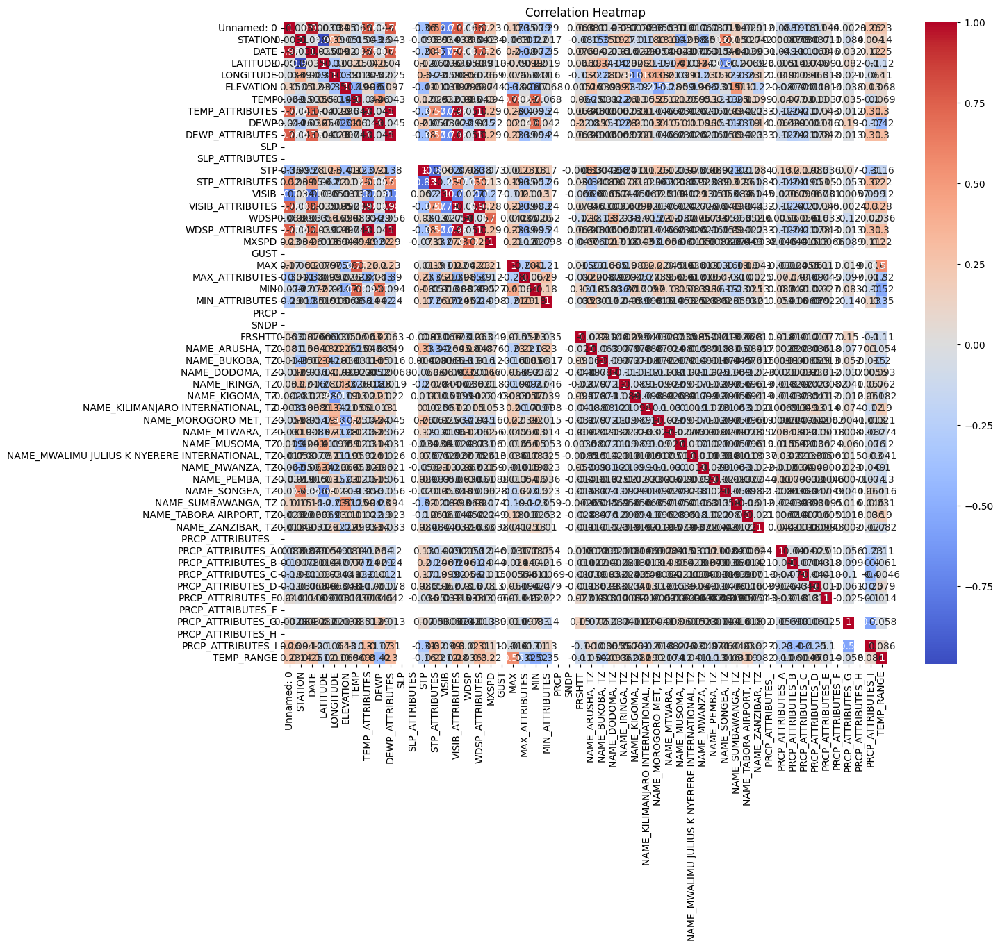

In [70]:
# Step 6: Visualization
# Correlation Heatmap
plt.figure(figsize=(14,12))
correlation_matrix = filtered_data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

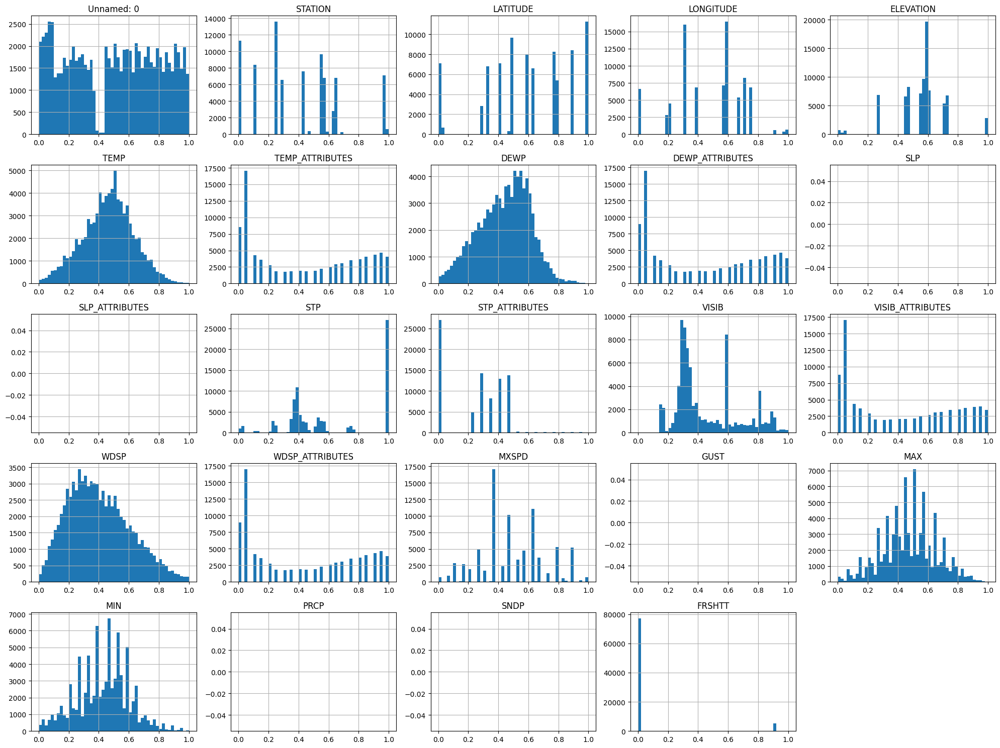

In [71]:
# Histograms
filtered_data[numerical_columns].hist(bins=50, figsize=(20,15))
plt.tight_layout()
plt.show()

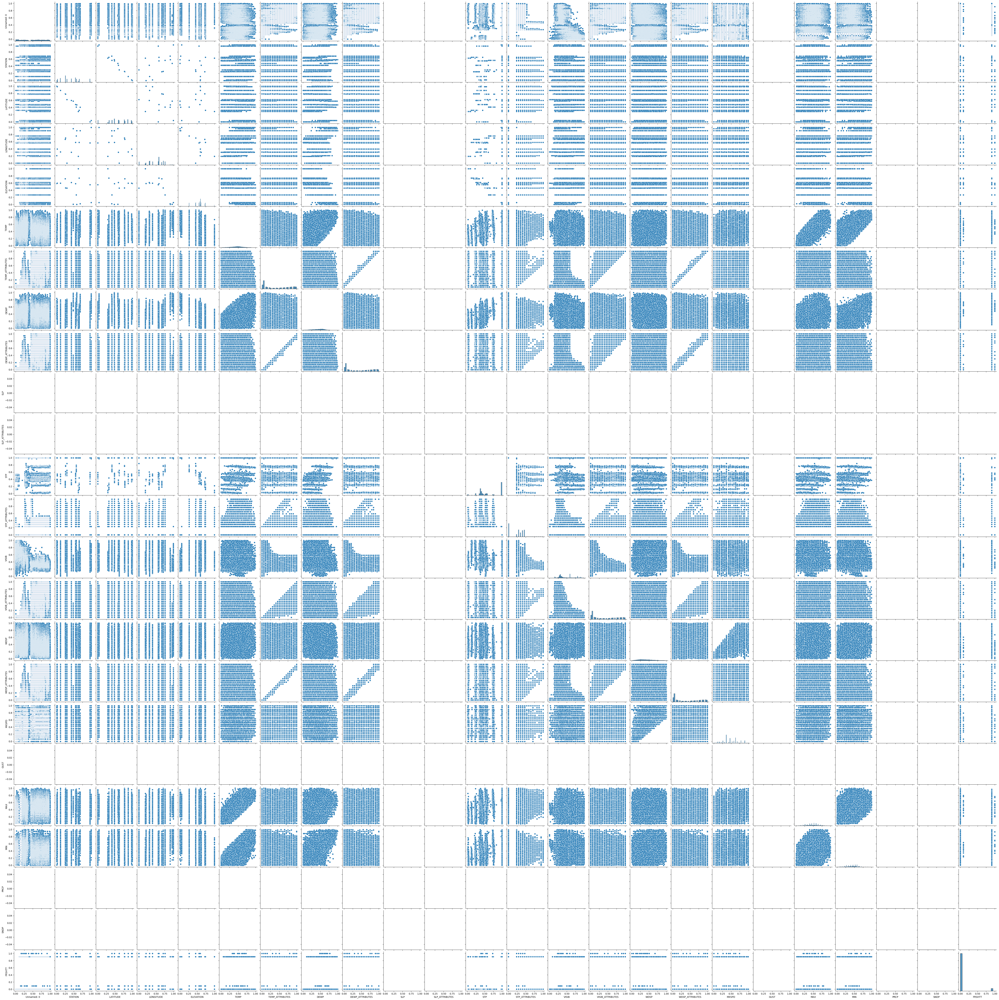

In [72]:
# Step 7: More Visualizations
# Pairplot for visualizing pairwise relationships
sns.pairplot(filtered_data[numerical_columns])
plt.show()

In [ ]:
#cleaned dataset

In [ ]:
#https://drive.google.com/file/d/1VTOmpa3ytNT5lkk6oKkBRtgVXnxwNcEv/view?usp=sharing